#Tugas Group Project 1
**Kelompok 10**
1. Hardhika Propitadewa (5026201015)
2. Tasya Putri Aliya (5026211116)
3. Alya Resti Saraswati (5026211057)
4. I Gusti Made Arisudana (5026211188)

#### **Import Libraries**


In [42]:
# Import Library Python
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [43]:
pd.set_option('display.max_columns',None) # to see ALL COLUMNS in a DataFrame table. 'None' means there is no limit for displayed columns.
# pd.set_option('display.max_rows',None) # to see ALL ROWS in a DataFrame table.

####**Import Database**

In [44]:
TGP1 = pd.read_csv('Data utk TGP #1.csv', delimiter =';')
TGP1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribe
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


# 1. Eksplorasi Data

####> Analisis Univariate

###### **Histogram Overview**

<Figure size 1000x1000 with 0 Axes>

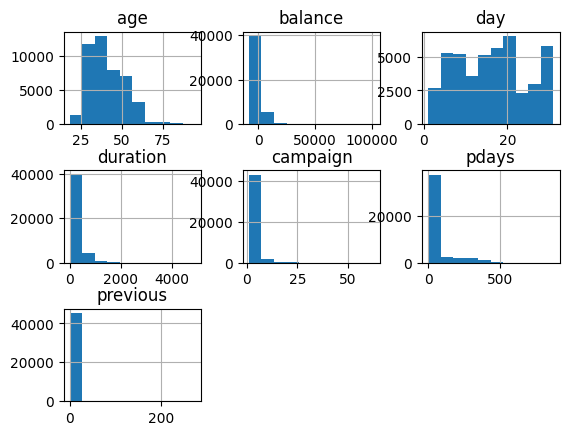

In [45]:
plt.figure(figsize = (10, 10))
TGP1.hist()
plt.subplots_adjust(hspace=0.5)
plt.show()

In [46]:
TGP1["age"].mean()
for i in TGP1:
  try:
    print(f"{i} mean is {TGP1[i].mean()}")
  except:
    continue

age mean is 40.93621021432837
balance mean is 1362.2720576850766
day mean is 15.80641879188693
duration mean is 258.1630797814691
campaign mean is 2.763840658246887
pdays mean is 40.19782796222158
previous mean is 0.5803233726305546


######**Histogram untuk data bertipe number**

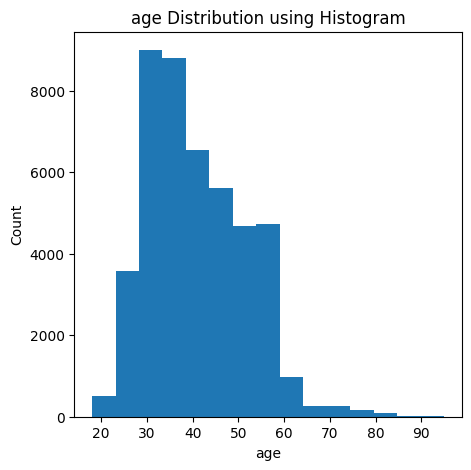

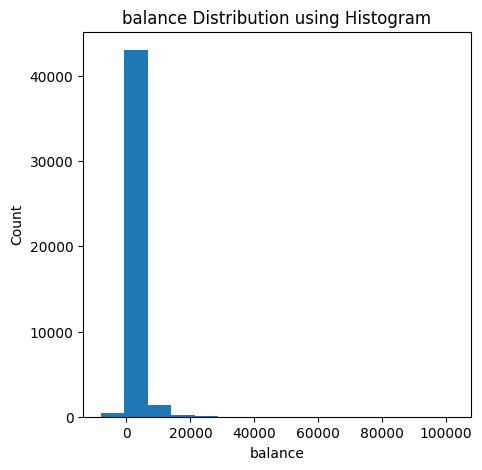

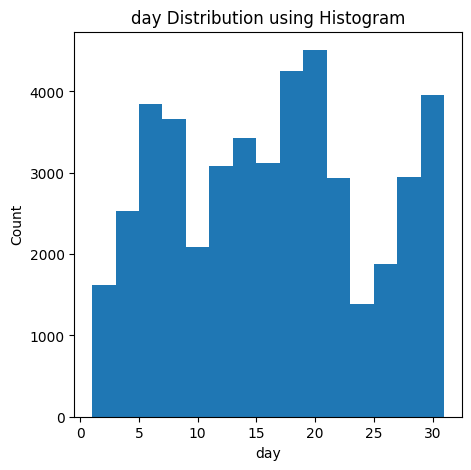

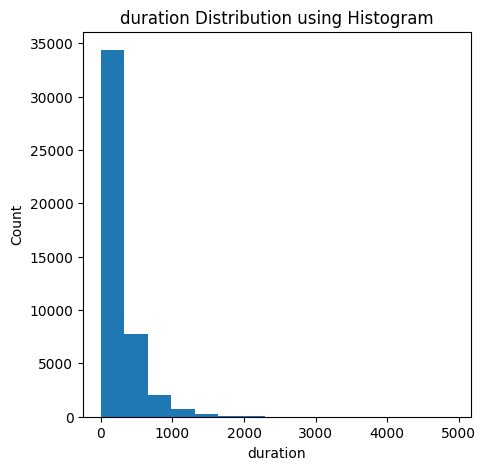

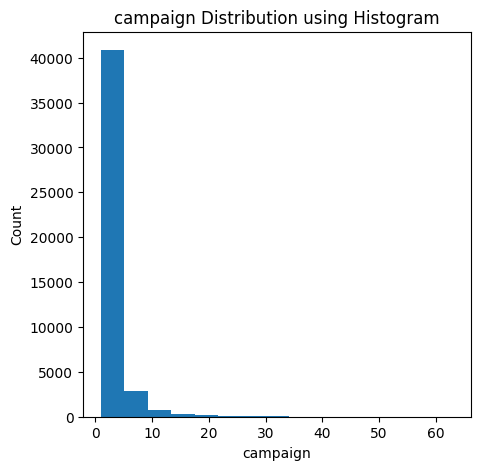

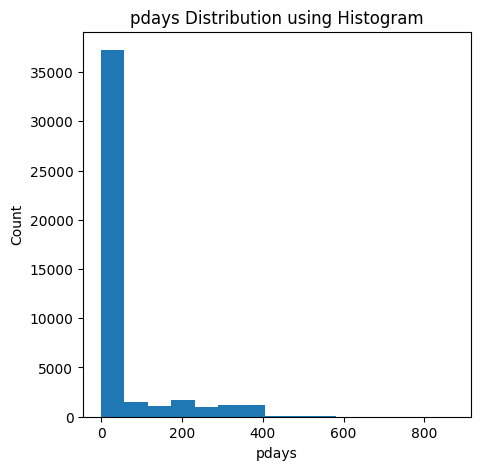

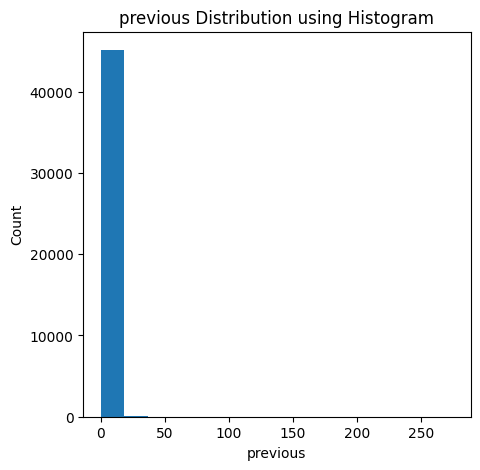

In [47]:
for col in TGP1.select_dtypes(include='number').columns:
  print()
  plt.figure(figsize = (5, 5))  # Ukuran gambar
  plt.hist(TGP1[col], bins=15)  # Data yang ingin divisualisasikan
  plt.title(f"{col} Distribution using Histogram")  # Judul visualisasi
  plt.xlabel(col)  # Label sumbu x
  plt.ylabel("Count")  # Label sumbu y
  plt.show()

######**Box Plot untuk data bertipe number**

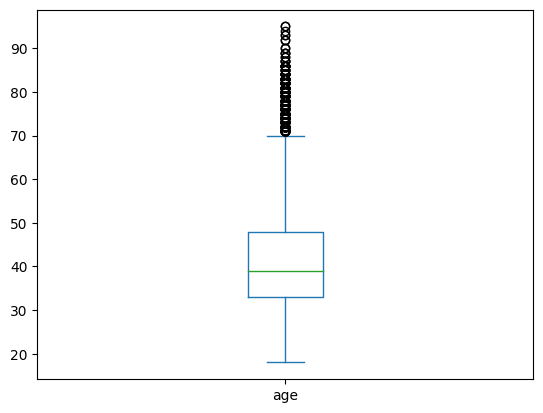

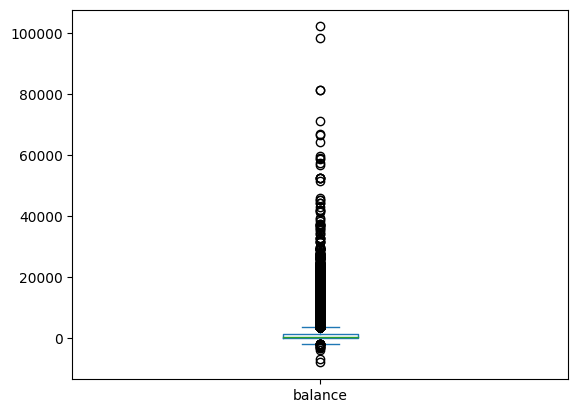

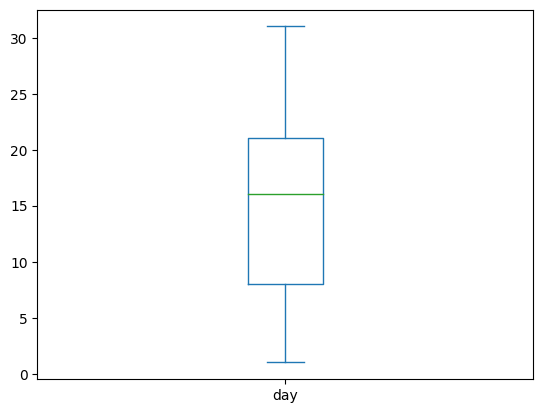

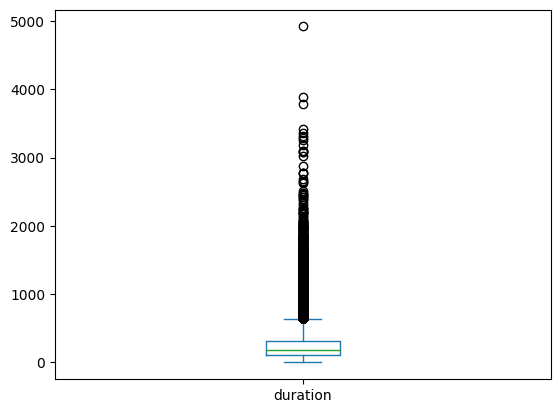

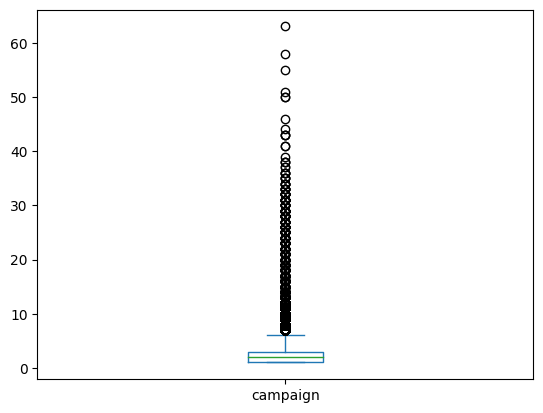

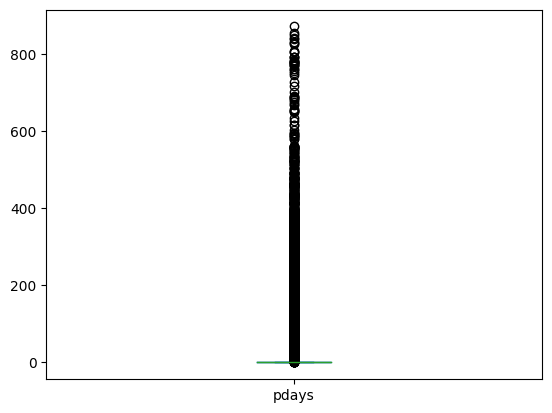

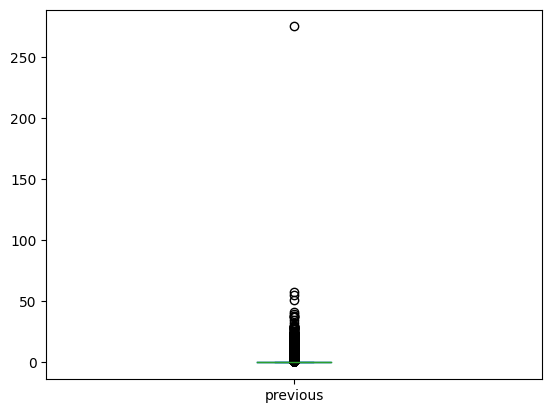

In [48]:
for col in TGP1.select_dtypes(include='number').columns:
  print()
  TGP1[col].plot(kind = "box")
  plt.show()

######**Pie Chart untuk kolom bertipe data object**

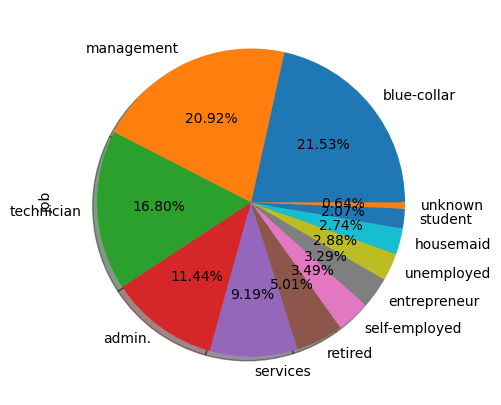

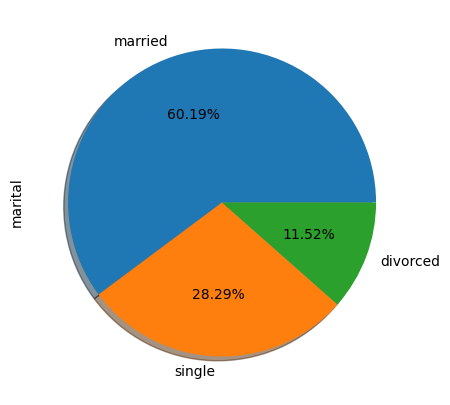

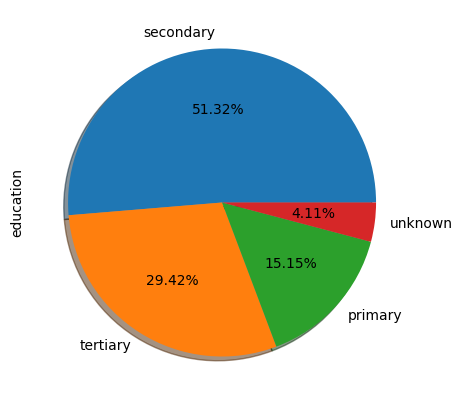

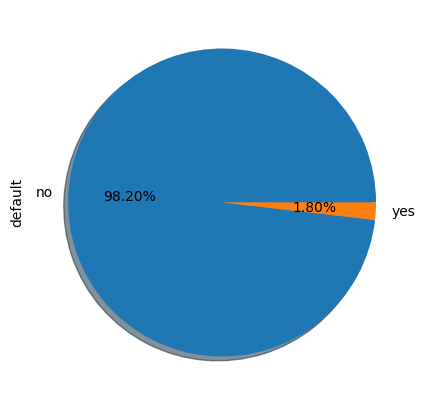

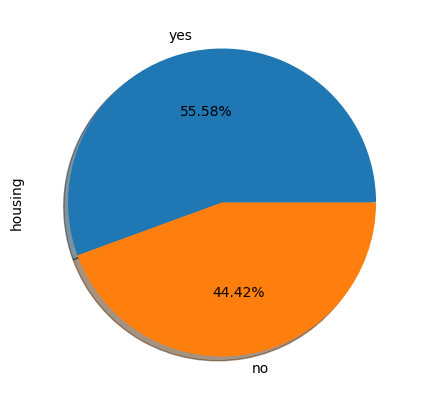

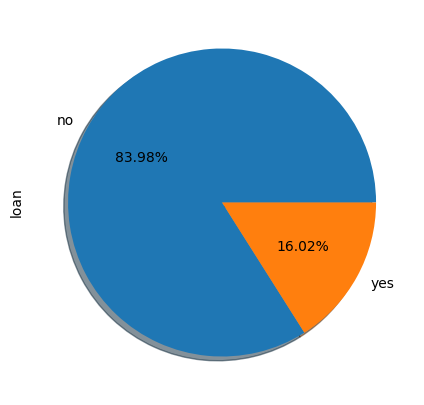

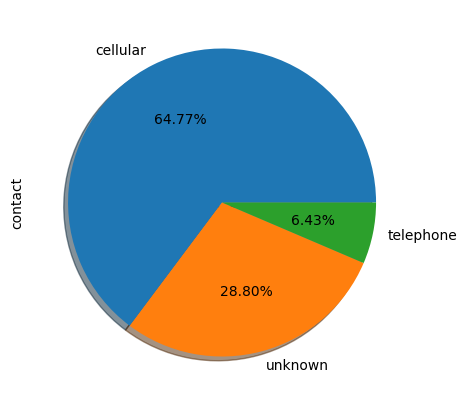

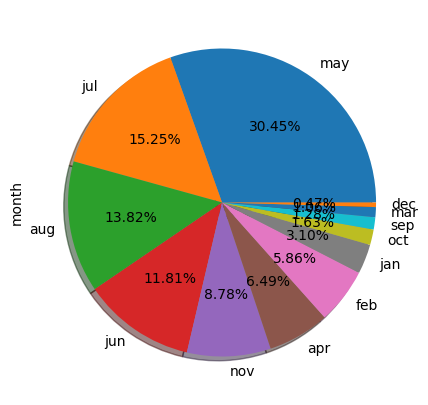

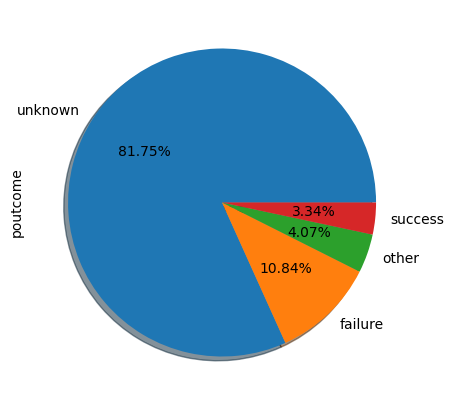

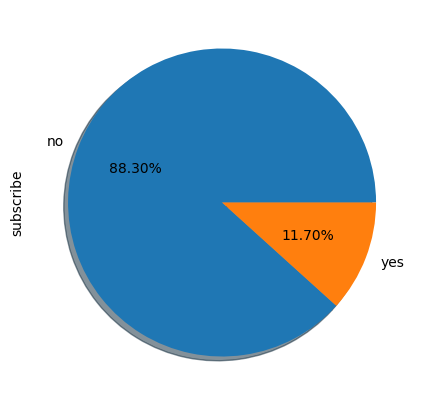

In [49]:
for col in TGP1.select_dtypes(include='object').columns:
  print()
  TGP1[col].value_counts().plot.pie(autopct='%.2f%%',shadow=True,figsize=(5,5))
  plt.show()

######**Bar Chart untuk kolom bertipe data object**

Untuk mendapatkan visualisasi terhadap beberapa data yang memiliki lebih dari 3 value maka dibuat visualisasi Bar Chart

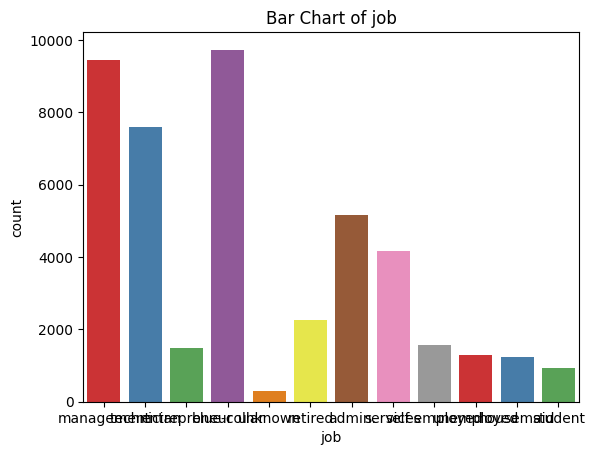

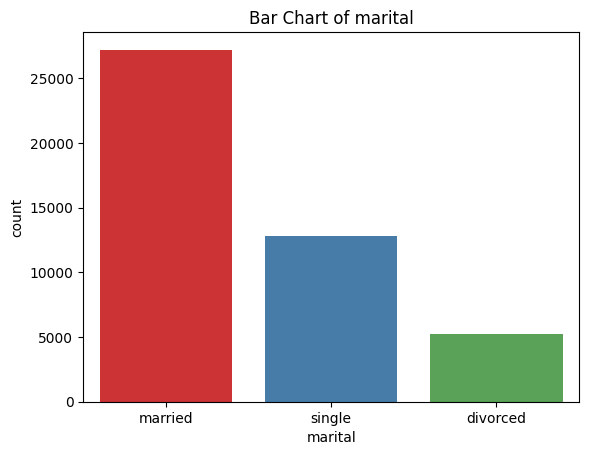

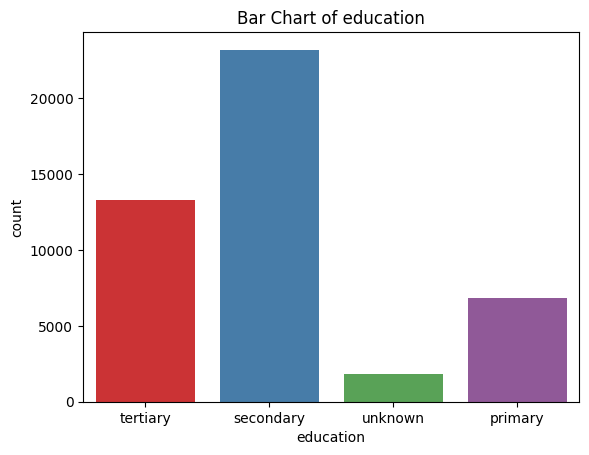

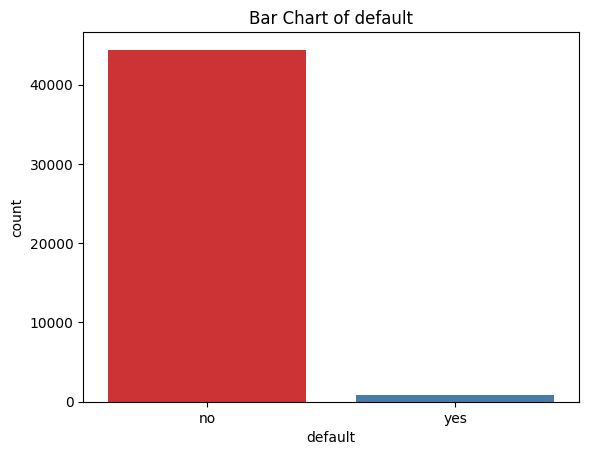

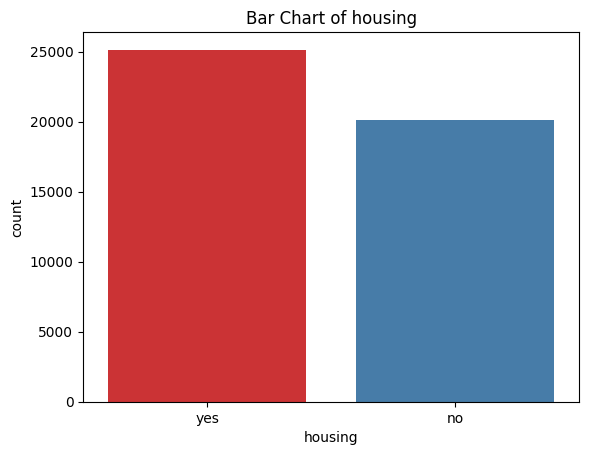

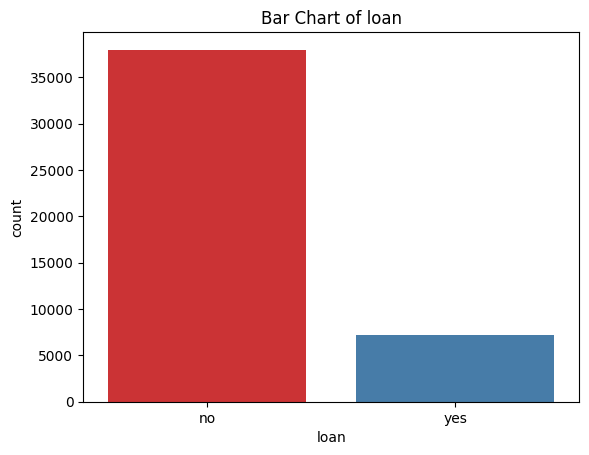

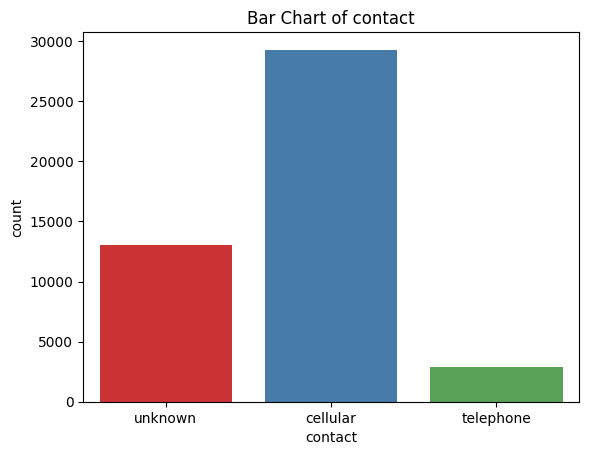

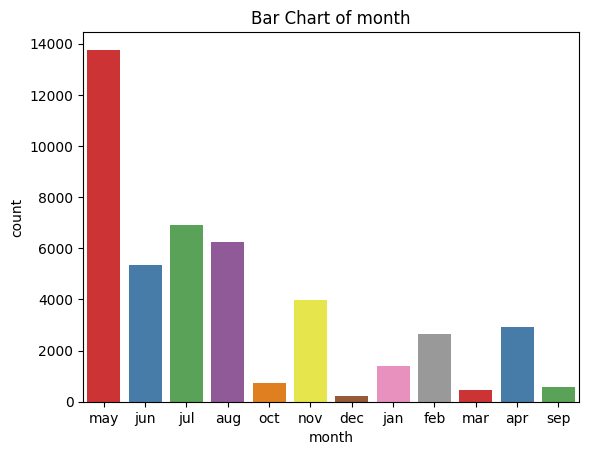

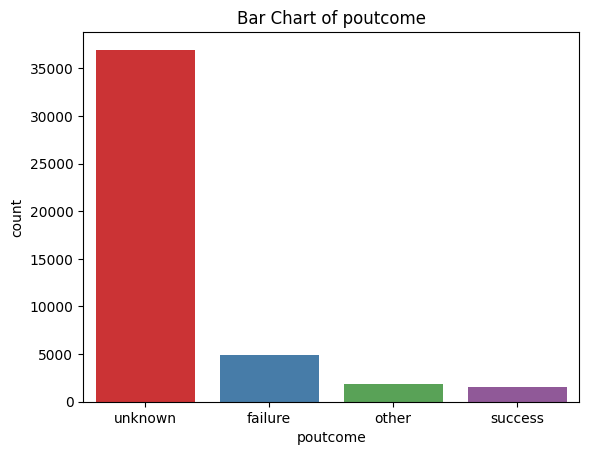

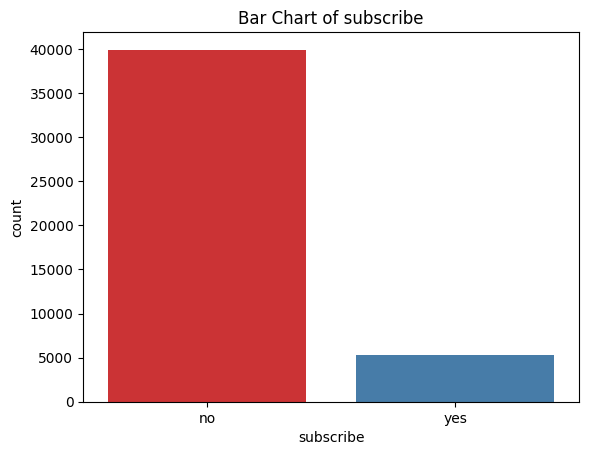

In [50]:
for col in TGP1.select_dtypes(include='object').columns:
  print()
  sns.countplot(data=TGP1, x=TGP1[col], palette='Set1')
  plt.title(f"Bar Chart of {col}")
  plt.xlabel(col)
  plt.ylabel('count')
  plt.show()

######**Histogram untuk bulan terakhir klien dihubungi**

Setelah melakukan beberapa eksplorasi didapatkan bahwa pemilihan terbaik untuk visualisasi Day dan Month adalah menggunakan Histogram oleh karena itu perlu dilakukan perubahan tipe data terlebih dahulu

Perubahan data menggunakan praproses data

In [51]:
TGP1['month'] = TGP1 ['month'].astype('category')
TGP1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        45211 non-null  int64   
 1   job        45211 non-null  object  
 2   marital    45211 non-null  object  
 3   education  45211 non-null  object  
 4   default    45211 non-null  object  
 5   balance    45211 non-null  int64   
 6   housing    45211 non-null  object  
 7   loan       45211 non-null  object  
 8   contact    45211 non-null  object  
 9   day        45211 non-null  int64   
 10  month      45211 non-null  category
 11  duration   45211 non-null  int64   
 12  campaign   45211 non-null  int64   
 13  pdays      45211 non-null  int64   
 14  previous   45211 non-null  int64   
 15  poutcome   45211 non-null  object  
 16  subscribe  45211 non-null  object  
dtypes: category(1), int64(7), object(9)
memory usage: 5.6+ MB


In [52]:
TGP1_encoded = TGP1
TGP1_encoded['month'] = TGP1_encoded['month'].cat.codes
TGP1_encoded

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribe
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,8,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,8,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,8,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,8,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,8,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,9,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,9,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,9,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,9,508,4,-1,0,unknown,no


Text(0, 0.5, 'Count')

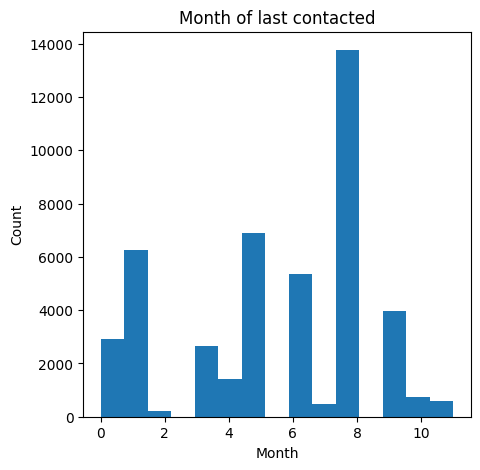

In [53]:
plt.figure(figsize = (5, 5))  # Ukuran gambar
plt.hist(TGP1["month"], bins=15)  # Data yang ingin divisualisasikan
plt.title("Month of last contacted")  # Judul visualisasi
plt.xlabel("Month")  # Label sumbu x
plt.ylabel("Count")  # Label sumbu y

###**Analisis Bivariate**

####**Scatter Matrix**

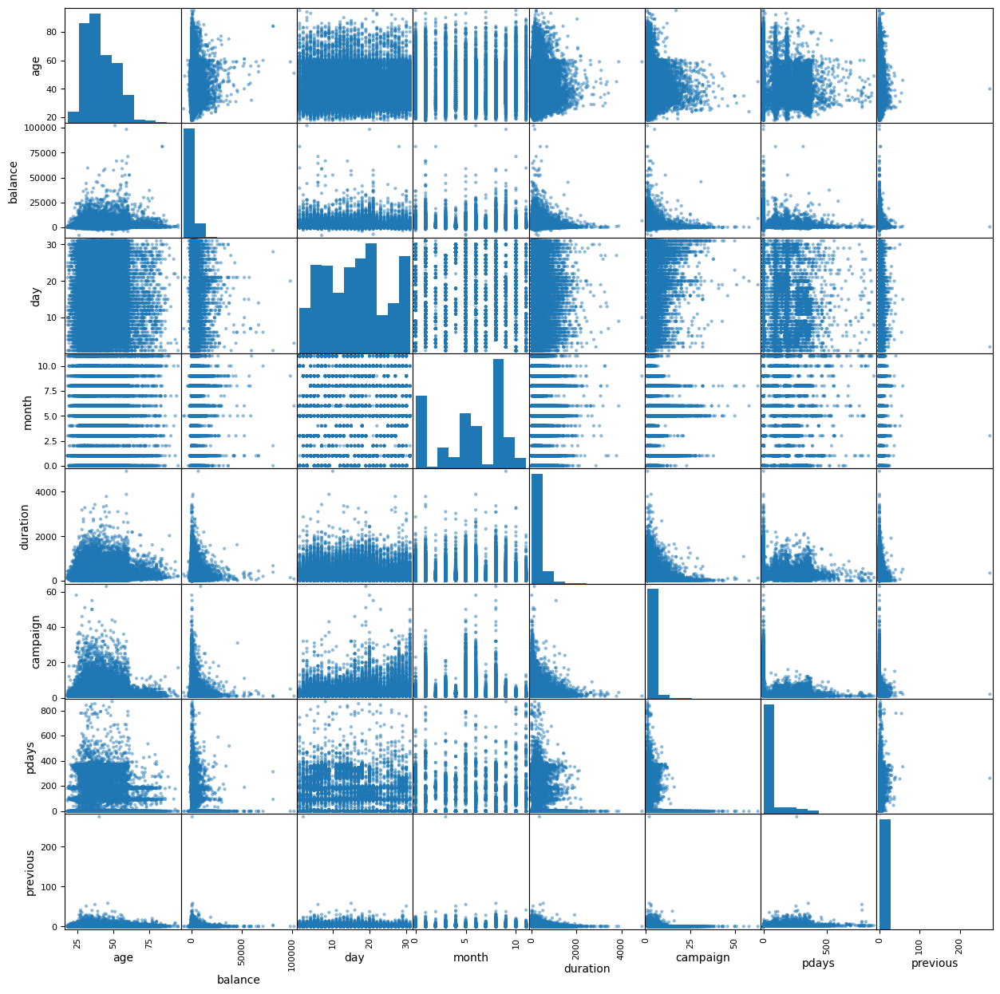

In [54]:
from pandas.plotting import scatter_matrix
scatter_matrix(TGP1, figsize = (15,15))
plt.show()

####**Scatter Plot untuk semua kolom**

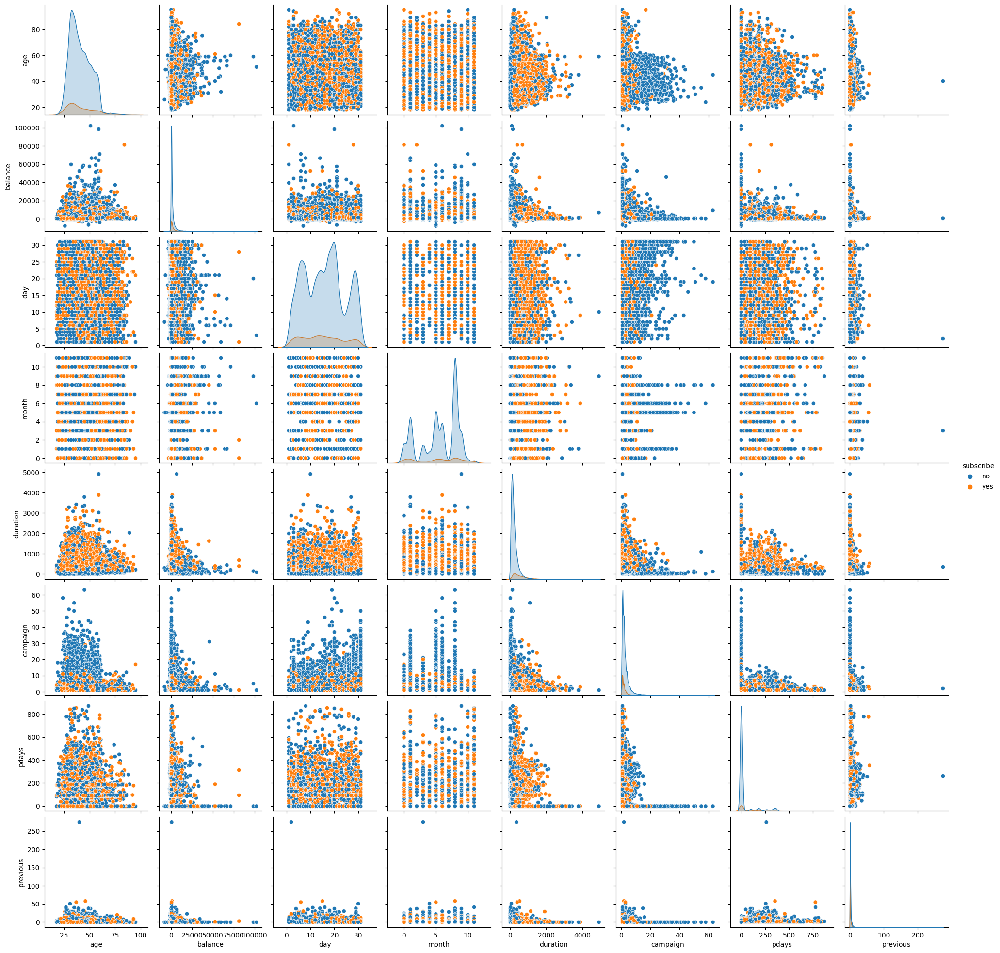

In [55]:
sns.pairplot(data=TGP1, hue='subscribe')

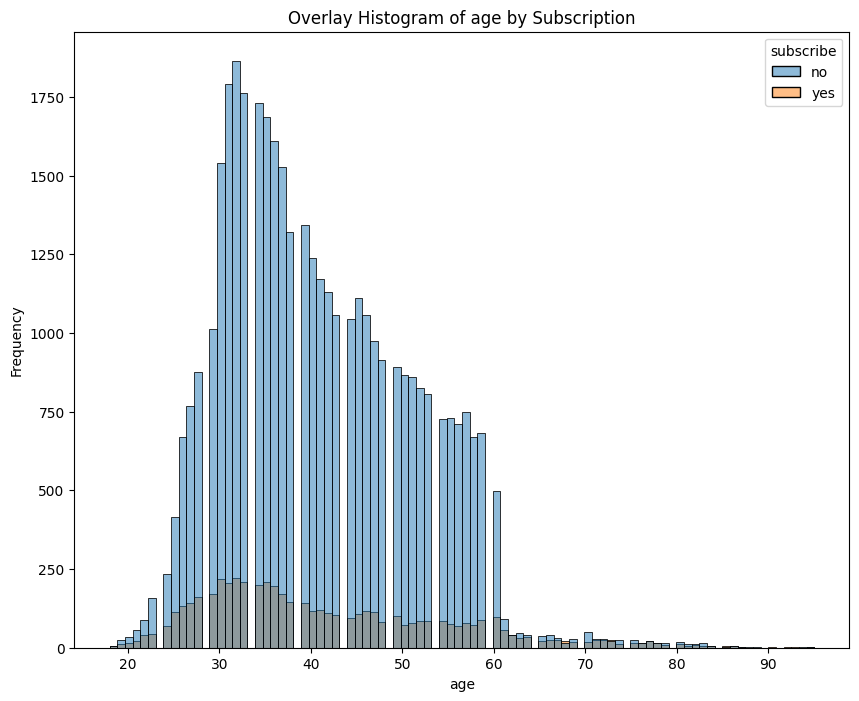

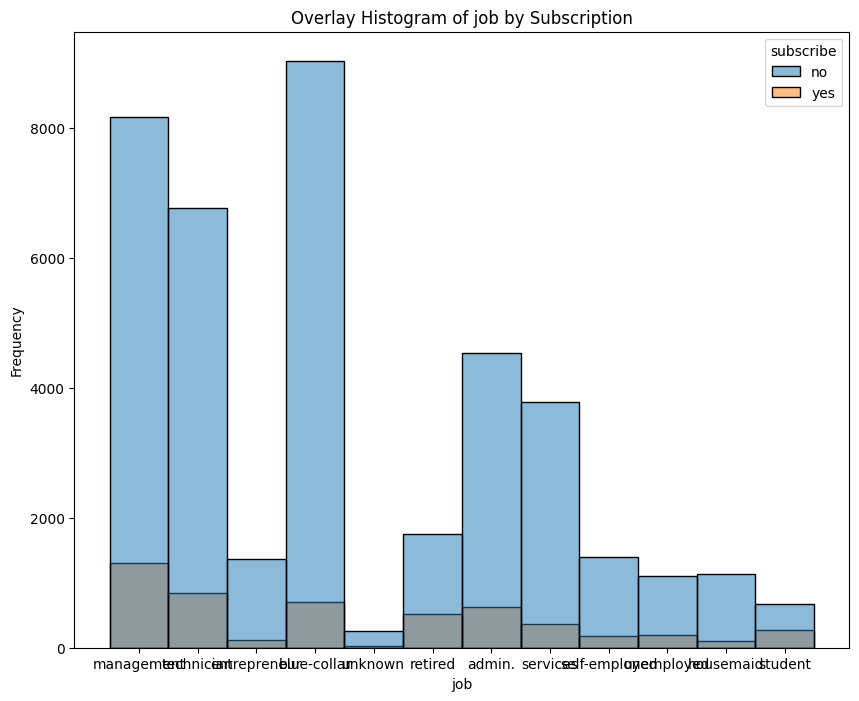

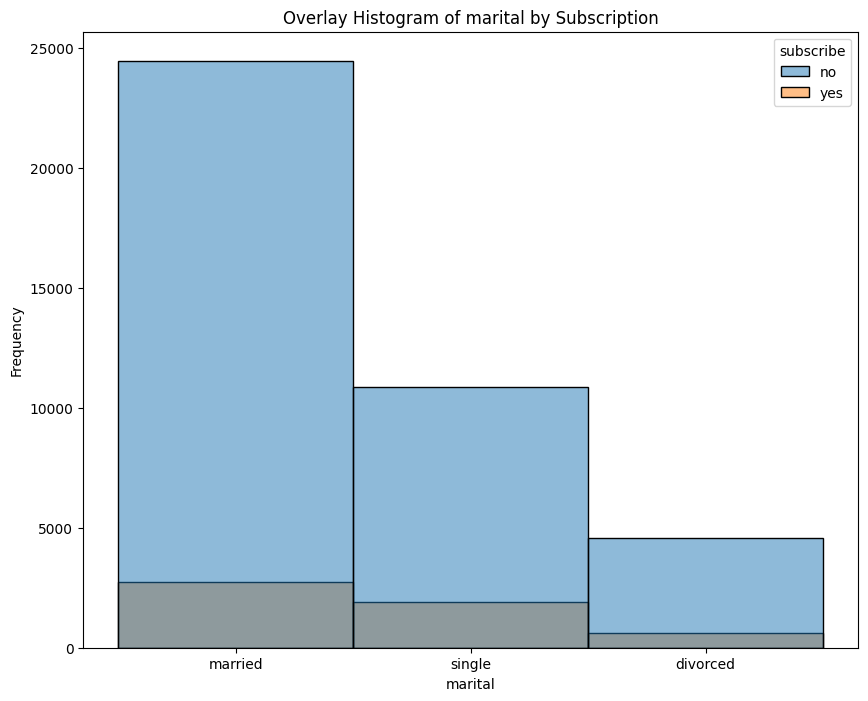

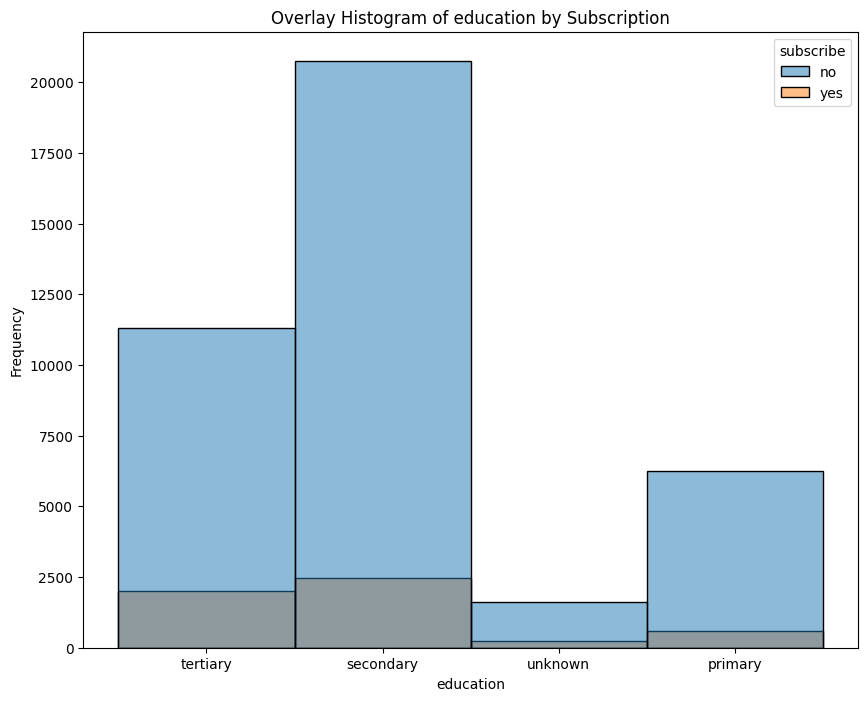

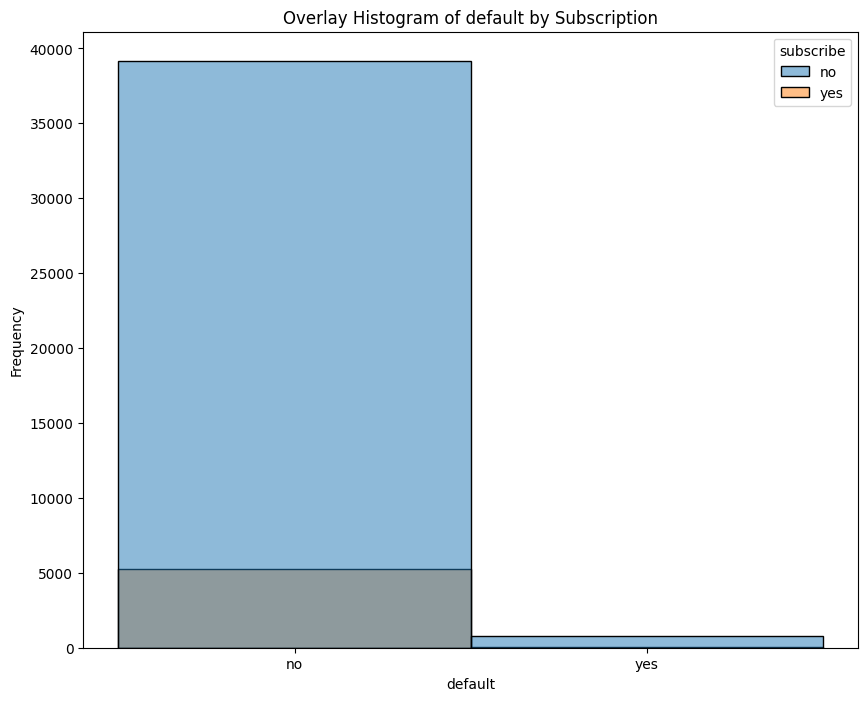

...

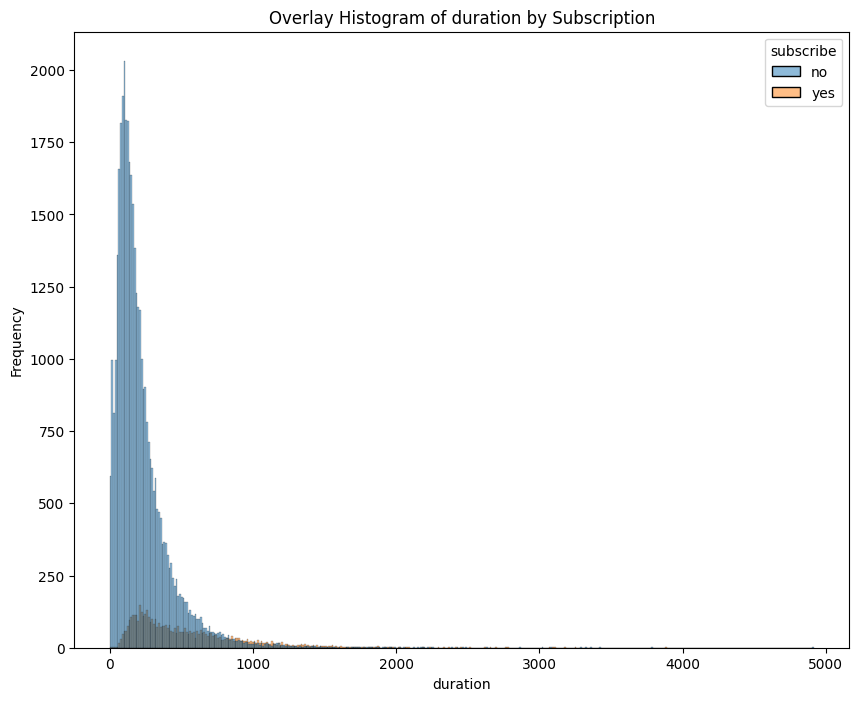

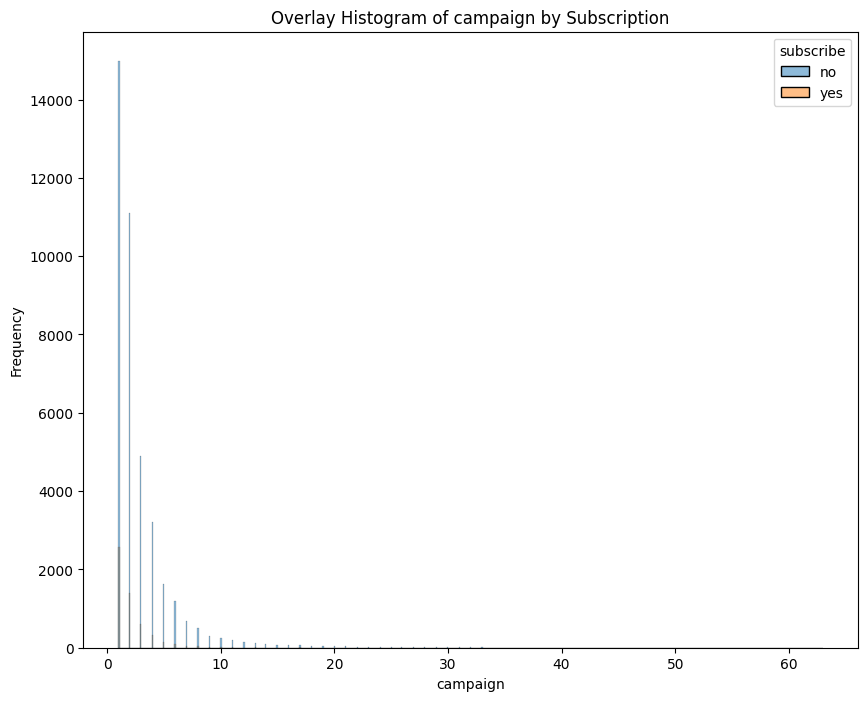

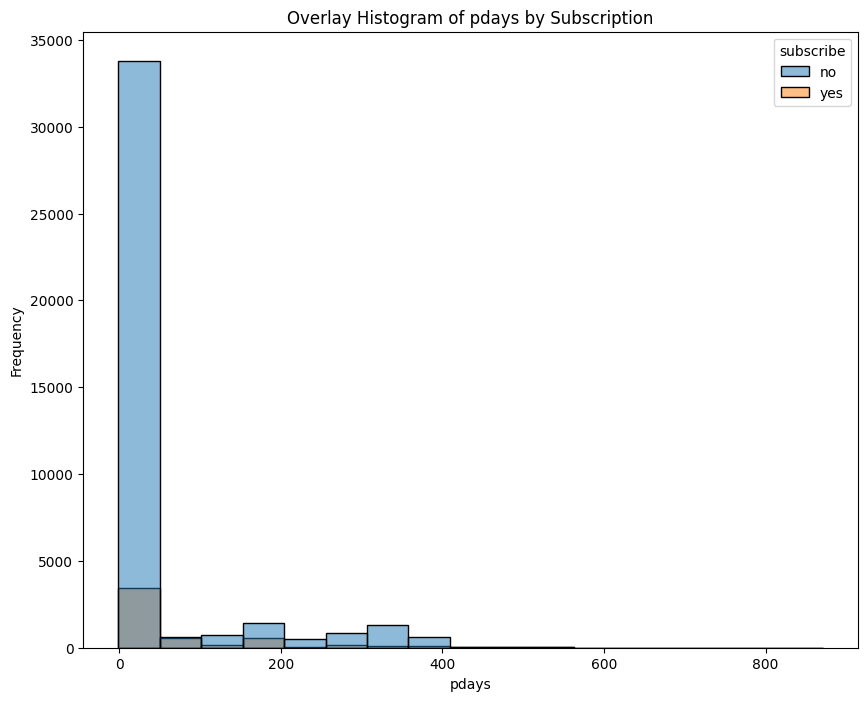

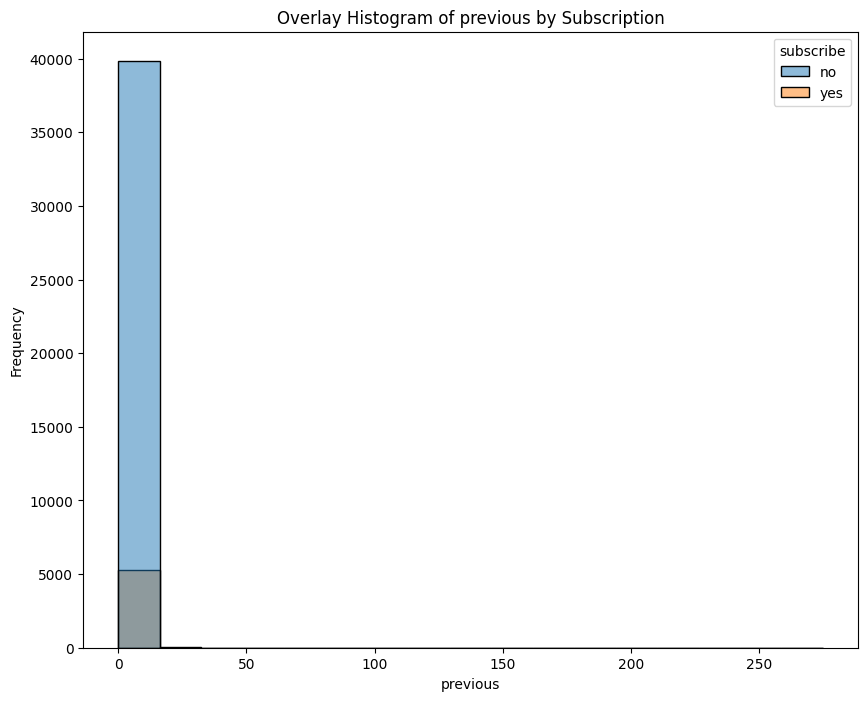

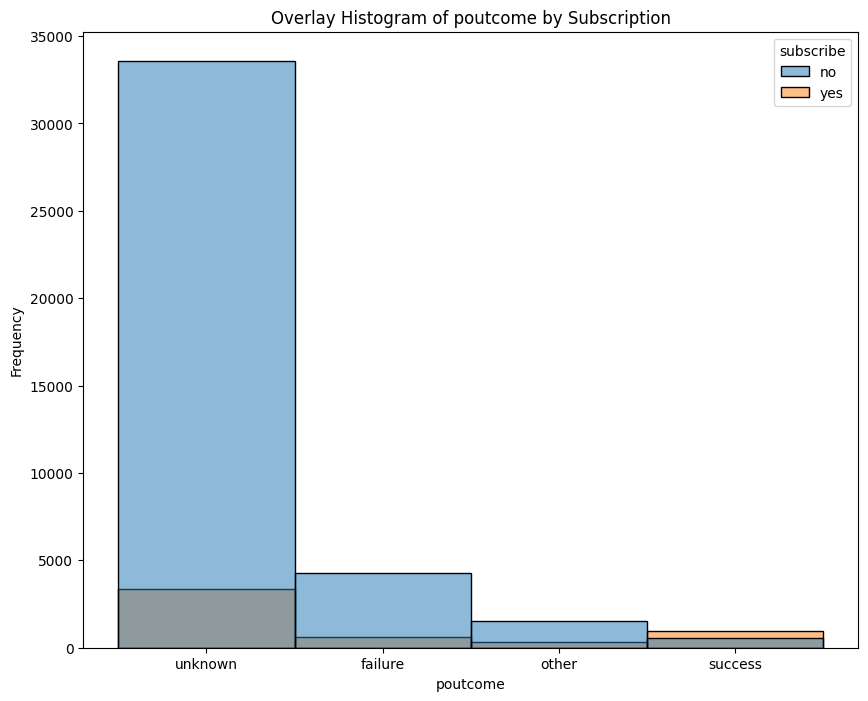

In [56]:
target_column = 'subscribe'
col_plot = [col for col in TGP1.columns if col != target_column]
for column in col_plot:
    plt.figure(figsize=(10, 8))
    sns.histplot(data=TGP1, x=column, hue=target_column,  common_norm=False)
    plt.title(f'Overlay Histogram of {column} by Subscription')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

####**Correlation ipada Raw Data**

######**Mapping bool column**

Merupakan bagian dari praproses data namun ditaruh di atas bagian praproses karena dibutuhkan dalam menghitung korelasi

In [57]:
TGP1 = TGP1.replace({'default' : {'yes': True , 'no': False}})
TGP1 = TGP1.replace({'housing' : {'yes': True , 'no': False}})
TGP1 = TGP1.replace({'loan' : {'yes': True , 'no': False}})
TGP1 = TGP1.replace({'subscribe' : {'yes': True , 'no': False}})
TGP1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribe
0,58,management,married,tertiary,False,2143,True,False,unknown,5,8,261,1,-1,0,unknown,False
1,44,technician,single,secondary,False,29,True,False,unknown,5,8,151,1,-1,0,unknown,False
2,33,entrepreneur,married,secondary,False,2,True,True,unknown,5,8,76,1,-1,0,unknown,False
3,47,blue-collar,married,unknown,False,1506,True,False,unknown,5,8,92,1,-1,0,unknown,False
4,33,unknown,single,unknown,False,1,False,False,unknown,5,8,198,1,-1,0,unknown,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,False,825,False,False,cellular,17,9,977,3,-1,0,unknown,True
45207,71,retired,divorced,primary,False,1729,False,False,cellular,17,9,456,2,-1,0,unknown,True
45208,72,retired,married,secondary,False,5715,False,False,cellular,17,9,1127,5,184,3,success,True
45209,57,blue-collar,married,secondary,False,668,False,False,telephone,17,9,508,4,-1,0,unknown,False


In [58]:
TGP1.corrwith(TGP1["subscribe"]).sort_values(ascending=False)

<ipython-input-58-647f1c18427a>:1: FutureWarning: The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  TGP1.corrwith(TGP1["subscribe"]).sort_values(ascending=False)


subscribe    1.000000
duration     0.394521
pdays        0.103621
previous     0.093236
balance      0.052838
age          0.025155
default     -0.022419
month       -0.024471
day         -0.028348
loan        -0.068185
campaign    -0.073172
housing     -0.139173
dtype: float64

#2. Praproses Data

In [59]:
# Menampilkan tipe data masing-masing kolom
TGP1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  bool  
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  bool  
 7   loan       45211 non-null  bool  
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  int8  
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  subscribe  45211 non-null  bool  
dtypes: bool(4), int64(7), int8(1), object(5)
memory usage: 4.4+ MB


####**Mengubah data object**

In [60]:
#Mengubah Tipe Data
TGP1['job'] = TGP1['job'].astype('category')
TGP1['marital'] = TGP1['marital'].astype('category')
TGP1['education'] = TGP1 ['education'].astype('category')
TGP1['default'] = TGP1['default'].astype('bool')
TGP1['housing'] = TGP1['housing'].astype('bool')
TGP1['loan'] = TGP1['loan'].astype('bool')
TGP1['contact'] = TGP1 ['contact'].astype('category')
TGP1['month'] = TGP1 ['month'].astype('category')
TGP1['subscribe'] = TGP1['subscribe'].astype('bool')
TGP1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        45211 non-null  int64   
 1   job        45211 non-null  category
 2   marital    45211 non-null  category
 3   education  45211 non-null  category
 4   default    45211 non-null  bool    
 5   balance    45211 non-null  int64   
 6   housing    45211 non-null  bool    
 7   loan       45211 non-null  bool    
 8   contact    45211 non-null  category
 9   day        45211 non-null  int64   
 10  month      45211 non-null  category
 11  duration   45211 non-null  int64   
 12  campaign   45211 non-null  int64   
 13  pdays      45211 non-null  int64   
 14  previous   45211 non-null  int64   
 15  poutcome   45211 non-null  object  
 16  subscribe  45211 non-null  bool    
dtypes: bool(4), category(5), int64(7), object(1)
memory usage: 3.1+ MB


####**Memeriksa Missing Value**

In [61]:
# Cek apakah terdapat baris yang kosong
TGP1.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
subscribe    0
dtype: int64

In [62]:
col_with_unknown = []
unknown_count = (TGP1 == "unknown").sum()
for col, count in unknown_count.items():
    value_count = TGP1[col].value_counts()
    if count > 0:
        col_with_unknown.append(col)
        print(f"{col} {value_count} \n")

job blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 

education secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 

contact cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64 

poutcome unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64 



####**Mengisi Missing Value**

Pengisian Missing Value kepada data yang memiliki value *unknown* menggunakan mode dan median value

1. Mengisi dengan mode value pada kolom yang ada

In [63]:
for col in col_with_unknown:
  TGP1_max = TGP1[col].value_counts().idxmax()
  TGP1[col].replace("unknown", TGP1_max, inplace=True)
TGP1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribe
0,58,management,married,tertiary,False,2143,True,False,cellular,5,8,261,1,-1,0,unknown,False
1,44,technician,single,secondary,False,29,True,False,cellular,5,8,151,1,-1,0,unknown,False
2,33,entrepreneur,married,secondary,False,2,True,True,cellular,5,8,76,1,-1,0,unknown,False
3,47,blue-collar,married,secondary,False,1506,True,False,cellular,5,8,92,1,-1,0,unknown,False
4,33,blue-collar,single,secondary,False,1,False,False,cellular,5,8,198,1,-1,0,unknown,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,False,825,False,False,cellular,17,9,977,3,-1,0,unknown,True
45207,71,retired,divorced,primary,False,1729,False,False,cellular,17,9,456,2,-1,0,unknown,True
45208,72,retired,married,secondary,False,5715,False,False,cellular,17,9,1127,5,184,3,success,True
45209,57,blue-collar,married,secondary,False,668,False,False,telephone,17,9,508,4,-1,0,unknown,False


In [64]:
#periksa kembali data
col_with_unknown = []
unknown_count = (TGP1 == "unknown").sum()
for col, count in unknown_count.items():
    value_count = TGP1[col].value_counts()
    if count > 0:
        col_with_unknown.append(col)
        print(f"{col} {value_count} \n")

poutcome unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64 



Masih terdapat data unknown karena sebelumnya mayoritas data dari poutcome merupakan unknown dan karena pengisian missing value dilakukan menggunakan mode maka hasil tetap menjadi unknown. Mengatasi missing value poutcome dapat menggunakan metode lain yaitu menghapus kolom karena merupakan data kategorikal dimana tidak dapat menggunakan mean dan median dan jika melakukan categorical encoding maka hasil yang diberikan akan berupa desimal dan ditakutkan menjadi tidak akurat.

In [65]:
TGP1 = TGP1.drop(columns='poutcome')
TGP1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,subscribe
0,58,management,married,tertiary,False,2143,True,False,cellular,5,8,261,1,-1,0,False
1,44,technician,single,secondary,False,29,True,False,cellular,5,8,151,1,-1,0,False
2,33,entrepreneur,married,secondary,False,2,True,True,cellular,5,8,76,1,-1,0,False
3,47,blue-collar,married,secondary,False,1506,True,False,cellular,5,8,92,1,-1,0,False
4,33,blue-collar,single,secondary,False,1,False,False,cellular,5,8,198,1,-1,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,False,825,False,False,cellular,17,9,977,3,-1,0,True
45207,71,retired,divorced,primary,False,1729,False,False,cellular,17,9,456,2,-1,0,True
45208,72,retired,married,secondary,False,5715,False,False,cellular,17,9,1127,5,184,3,True
45209,57,blue-collar,married,secondary,False,668,False,False,telephone,17,9,508,4,-1,0,False


####**Memeriksa data dupilkat**

In [66]:
#Cek data yang duplikat
jumlah_baris_duplikat = TGP1.duplicated().sum()
print("Jumlah baris yang memiliki data sama: {} baris".format(jumlah_baris_duplikat))

Jumlah baris yang memiliki data sama: 0 baris


####**Melakukan categorical encoding/Transformasi Data**

In [67]:
# Mencari kategori apa saja pada sebuah kolom
kategori_job = TGP1['job'].unique()
kategori_marital = TGP1['marital'].unique()
kategori_education = TGP1['education'].unique()
kategori_contact = TGP1['contact'].unique()
kategori_month = TGP1['month'].unique()

print('kategori job:',kategori_job)
print('kategori marital:',kategori_marital)
print('kategori education:',kategori_education)
print('kategori contact:',kategori_contact)
print('kategori month:',kategori_month)

kategori job: ['management', 'technician', 'entrepreneur', 'blue-collar', 'retired', ..., 'services', 'self-employed', 'unemployed', 'housemaid', 'student']
Length: 11
Categories (11, object): ['admin.', 'blue-collar', 'entrepreneur', 'housemaid', ..., 'services',
                          'student', 'technician', 'unemployed']
kategori marital: ['married', 'single', 'divorced']
Categories (3, object): ['divorced', 'married', 'single']
kategori education: ['tertiary', 'secondary', 'primary']
Categories (3, object): ['primary', 'secondary', 'tertiary']
kategori contact: ['cellular', 'telephone']
Categories (2, object): ['cellular', 'telephone']
kategori month: [8, 6, 5, 1, 10, ..., 4, 3, 7, 0, 11]
Length: 12
Categories (12, int64): [0, 1, 2, 3, ..., 8, 9, 10, 11]


In [68]:
# Menggunakan replace()
TGP1_encoded = TGP1.replace({'default' : {True: 0 , False: 1}})
TGP1_encoded = TGP1.replace({'housing' : {True: 0 , False: 1}})
TGP1_encoded = TGP1.replace({'loan' : {True: 0 , False: 1}})
TGP1_encoded = TGP1.replace({'subscribe' : {True: 0 , False: 1}})
TGP1_encoded.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,subscribe
0,58,management,married,tertiary,False,2143,True,False,cellular,5,8,261,1,-1,0,1
1,44,technician,single,secondary,False,29,True,False,cellular,5,8,151,1,-1,0,1
2,33,entrepreneur,married,secondary,False,2,True,True,cellular,5,8,76,1,-1,0,1
3,47,blue-collar,married,secondary,False,1506,True,False,cellular,5,8,92,1,-1,0,1
4,33,blue-collar,single,secondary,False,1,False,False,cellular,5,8,198,1,-1,0,1


In [69]:
for col in TGP1.select_dtypes(include='category').columns:
  TGP1_encoded[col] = TGP1_encoded[col].cat.codes
TGP1_encoded

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,subscribe
0,58,4,1,2,False,2143,True,False,0,5,8,261,1,-1,0,1
1,44,9,2,1,False,29,True,False,0,5,8,151,1,-1,0,1
2,33,2,1,1,False,2,True,True,0,5,8,76,1,-1,0,1
3,47,1,1,1,False,1506,True,False,0,5,8,92,1,-1,0,1
4,33,1,2,1,False,1,False,False,0,5,8,198,1,-1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,False,825,False,False,0,17,9,977,3,-1,0,0
45207,71,5,0,0,False,1729,False,False,0,17,9,456,2,-1,0,0
45208,72,5,1,1,False,5715,False,False,0,17,9,1127,5,184,3,0
45209,57,1,1,1,False,668,False,False,1,17,9,508,4,-1,0,1


####**Mencari Outliers**

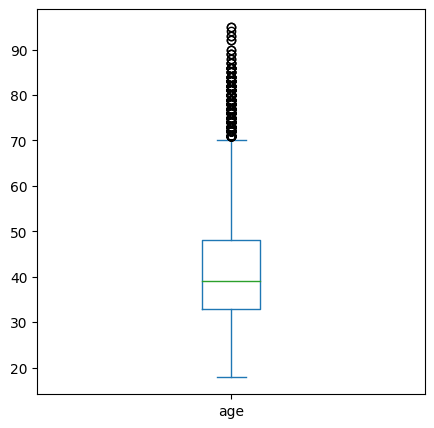

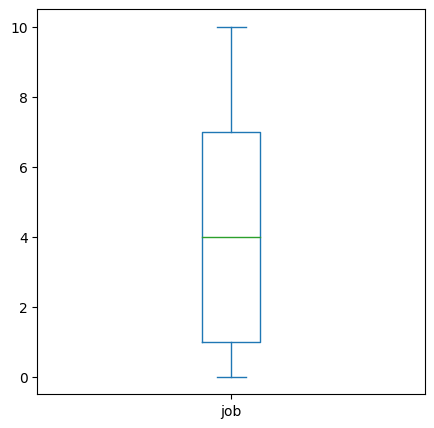

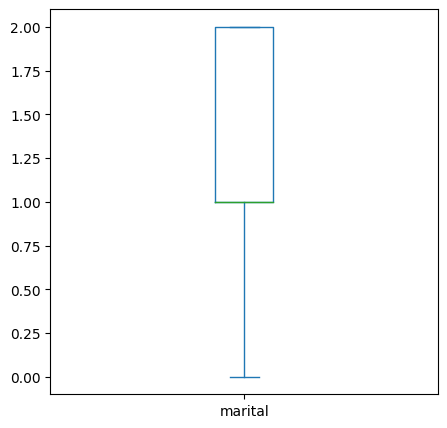

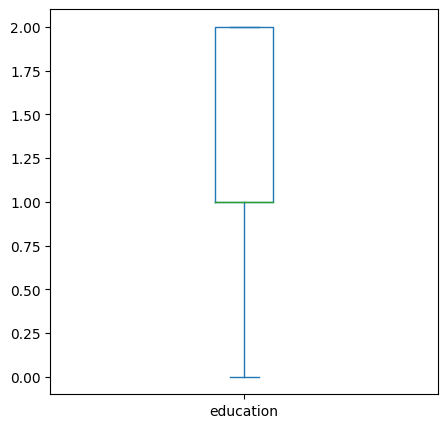

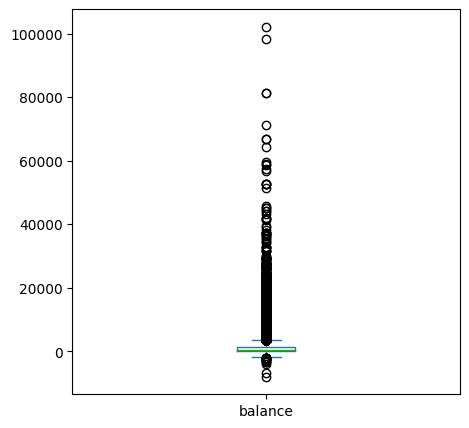

...

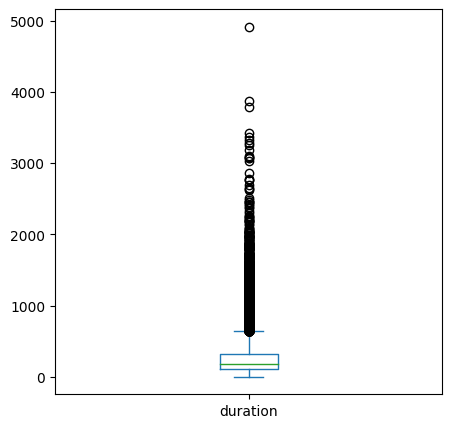

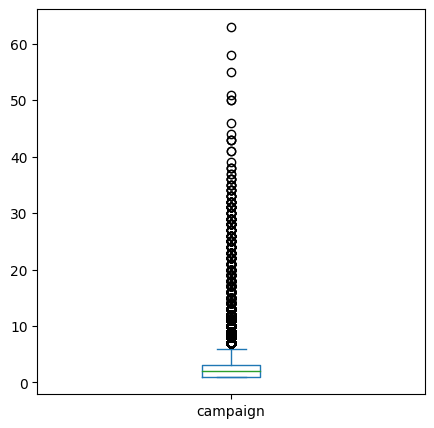

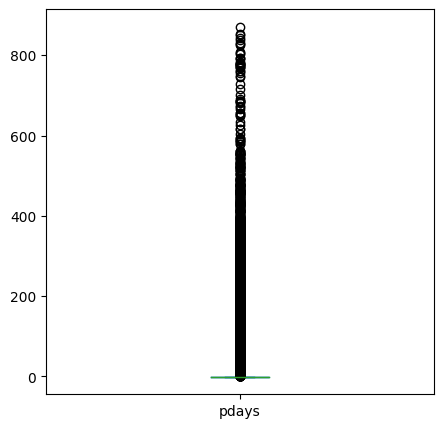

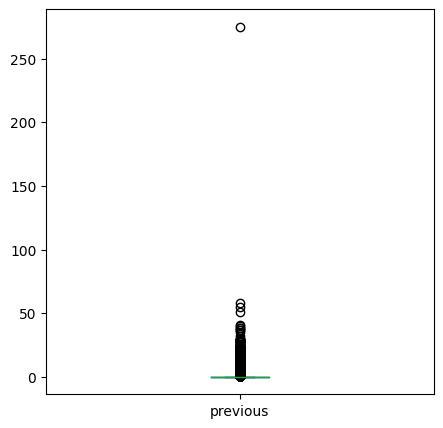

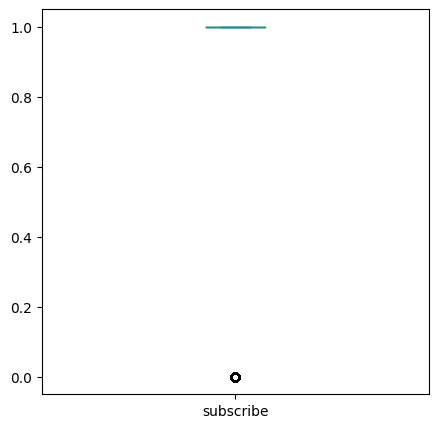

In [70]:
for col in TGP1_encoded.select_dtypes(include="number").columns:
  plt.figure(figsize = (5, 5))
  TGP1_encoded[col].plot(kind="box")
  plt.show()

####**Menghapus outliers**

In [71]:
# threshold value for z-score
threshold = 3

In [72]:
# Menghapus outlier menggunakan Z-score dengan Threshold 3
def remove_outliers_zscore_loop(TGP1, threshold=3):
    outliers = []
    for col in TGP1_encoded.select_dtypes(include=np.number).columns:
        z_scores = np.abs((TGP1_encoded[col] - TGP1_encoded[col].mean()) / TGP1_encoded[col].std())
        outliers.append(z_scores <= threshold)
    outliers = np.all(outliers, axis=0)
    TGP1_no_outliers = TGP1_encoded[outliers]
    return TGP1_no_outliers

TGP1_cleaned = remove_outliers_zscore_loop(TGP1)
print(TGP1_cleaned)

       age  job  marital  education  default  balance  housing   loan  \
0       58    4        1          2    False     2143     True  False   
1       44    9        2          1    False       29     True  False   
2       33    2        1          1    False        2     True   True   
3       47    1        1          1    False     1506     True  False   
4       33    1        2          1    False        1    False  False   
...    ...  ...      ...        ...      ...      ...      ...    ...   
45202   34    0        2          1    False      557    False  False   
45203   23    8        2          2    False      113    False  False   
45205   25    9        2          1    False      505    False   True   
45206   51    9        1          2    False      825    False  False   
45207   71    5        0          0    False     1729    False  False   

       contact  day  month  duration  campaign  pdays  previous  subscribe  
0            0    5      8       261         1

####**Visualisasi setelah praproses data**

<Figure size 1000x1000 with 0 Axes>

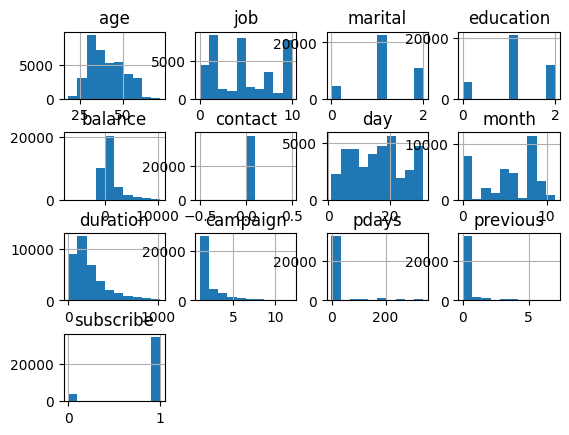

In [73]:
plt.figure(figsize = (10, 10))
TGP1_cleaned.hist()
plt.subplots_adjust(hspace=0.5)
plt.show()

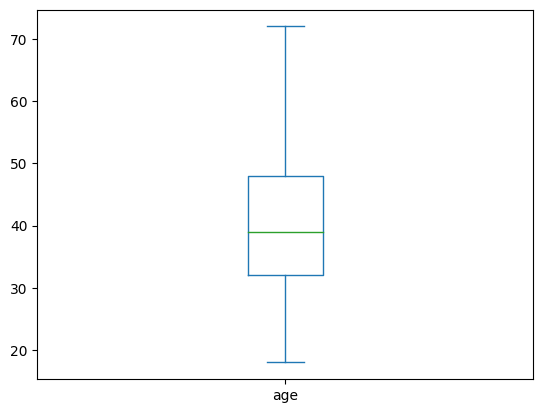

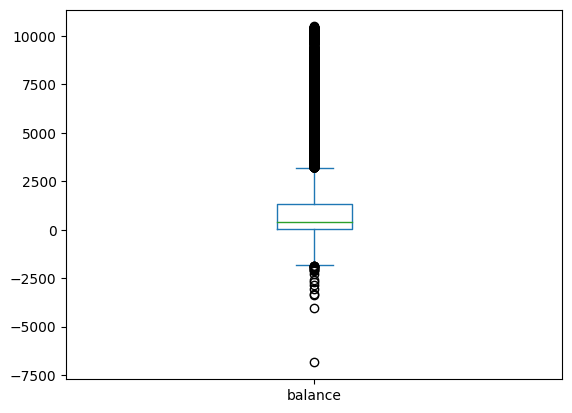

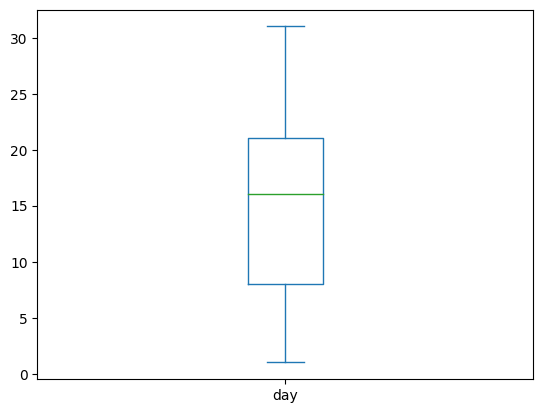

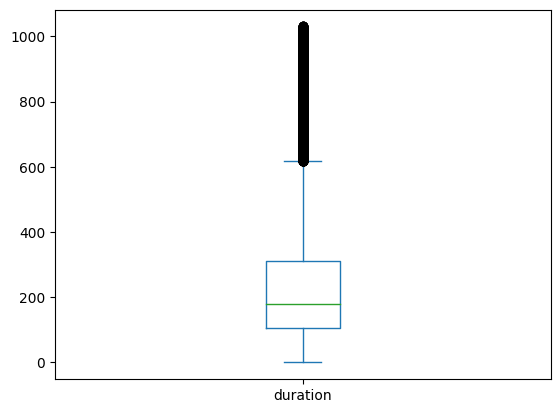

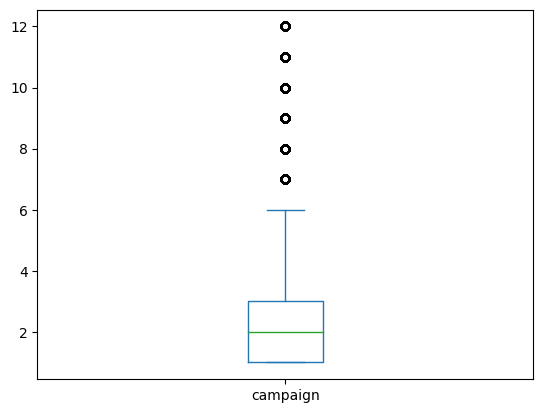

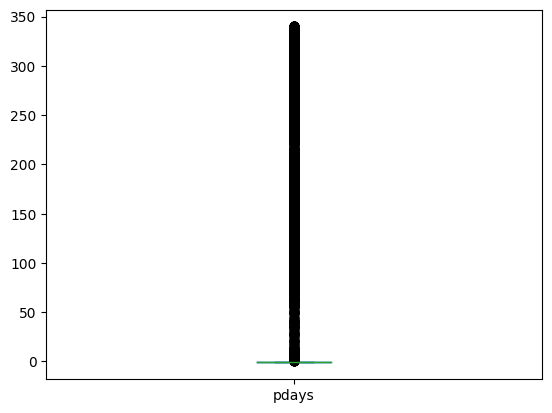

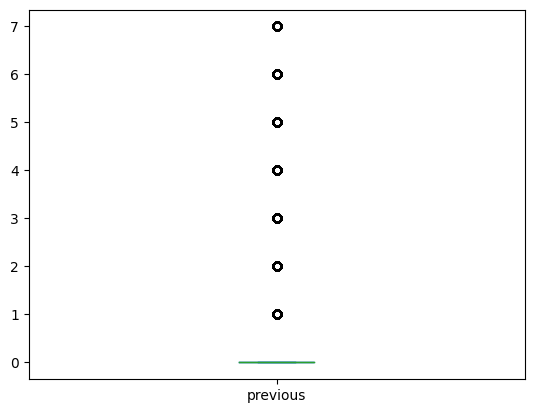

In [74]:
for col in TGP1.select_dtypes(include='number').columns:
  print()
  TGP1_cleaned[col].plot(kind = "box")
  plt.show()

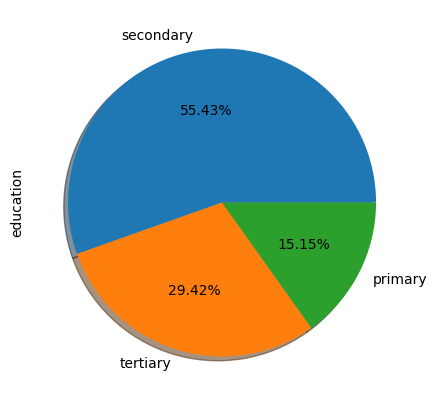

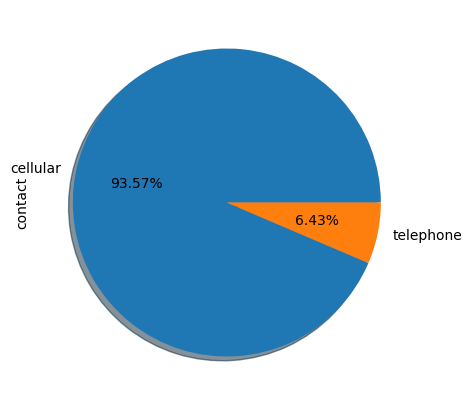

In [75]:
pie_chart_cleaned = ["education", "contact"]
for col in TGP1[pie_chart_cleaned].columns:
  print()
  TGP1[col].value_counts().plot.pie(autopct='%.2f%%',shadow=True,figsize=(5,5))
  plt.show()

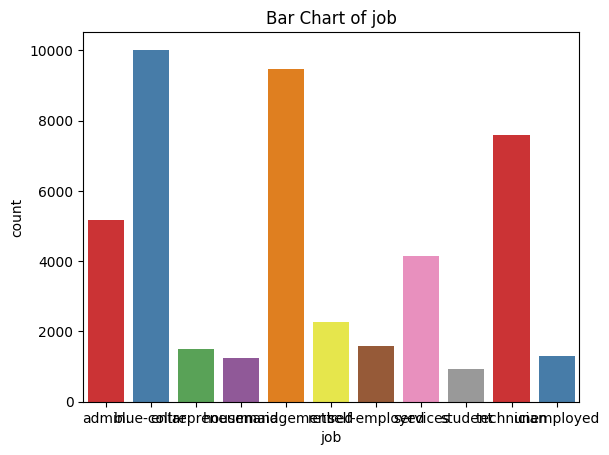

In [76]:
sns.countplot(data=TGP1_cleaned, x=TGP1["job"], palette='Set1')
plt.title("Bar Chart of job")
plt.xlabel("job")
plt.ylabel("count")
plt.show()

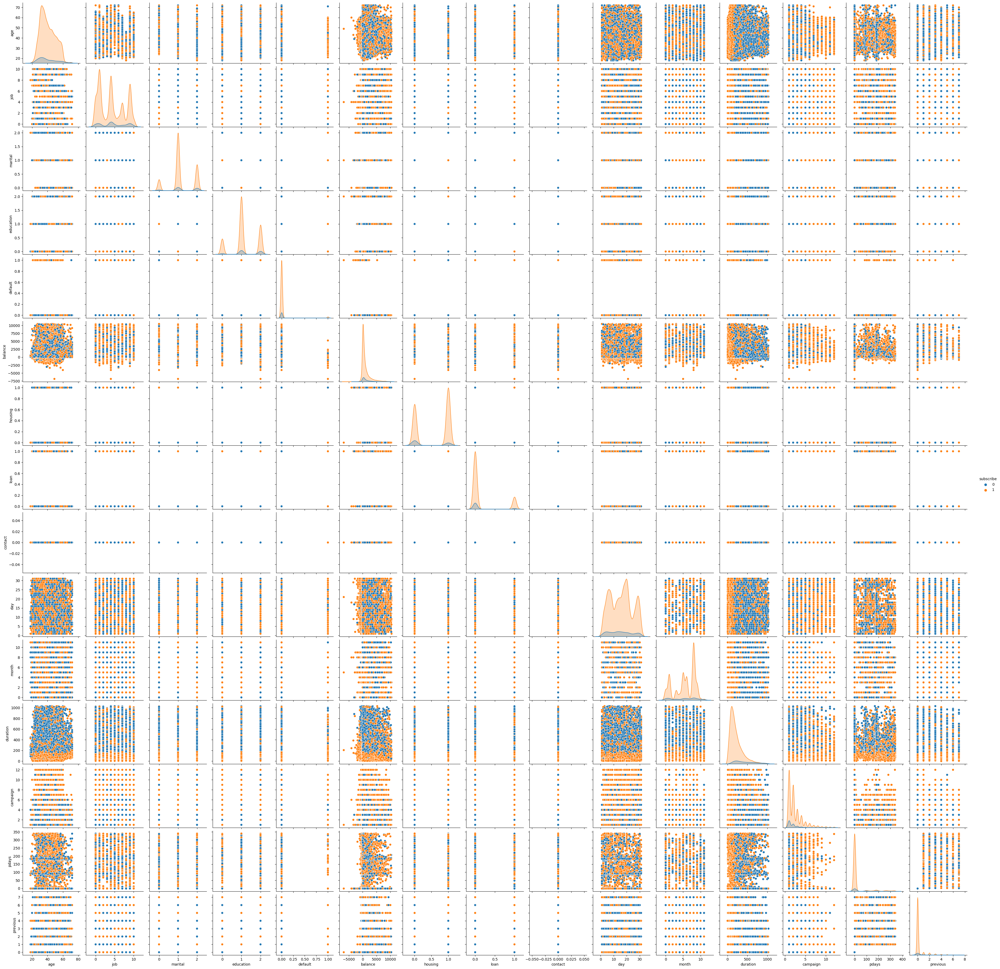

In [77]:
sns.pairplot(data=TGP1_cleaned, hue='subscribe')

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<__array_functio

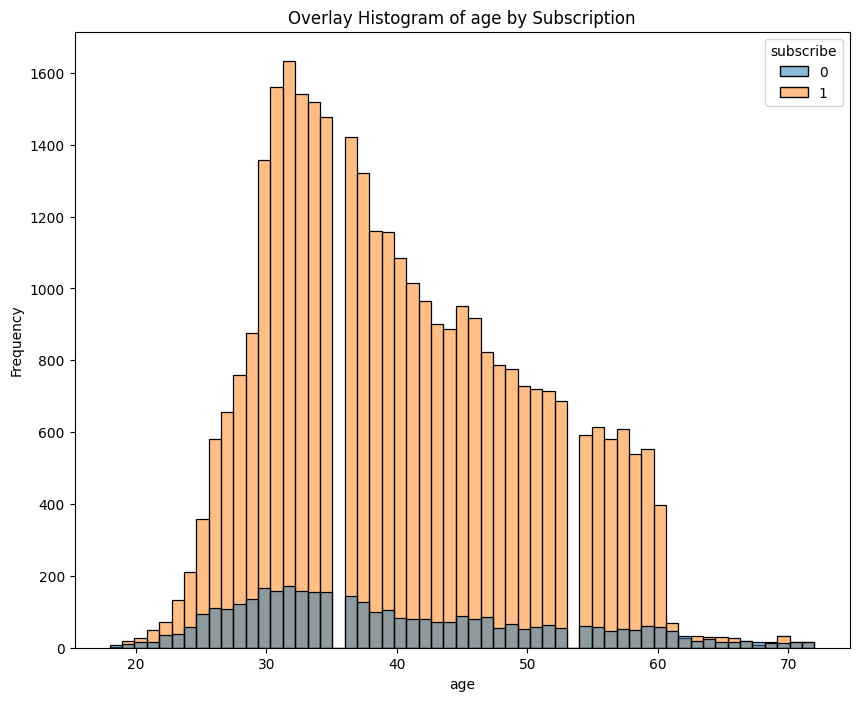

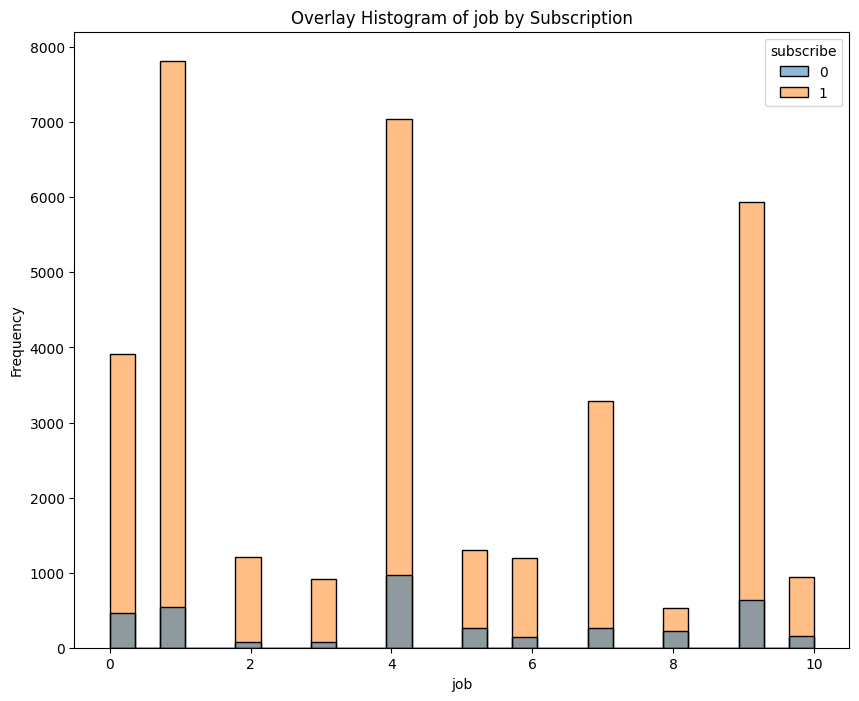

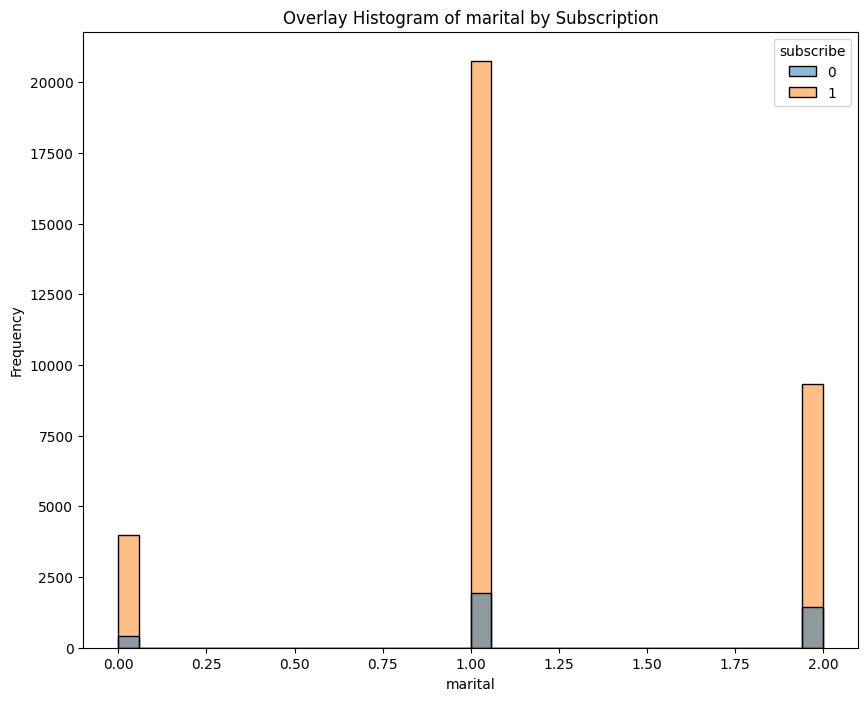

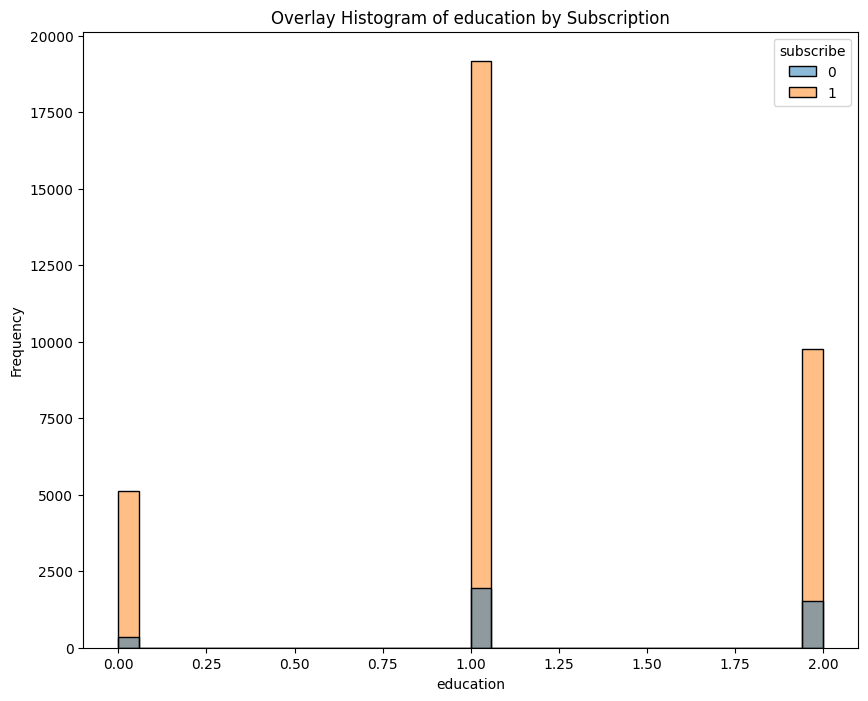

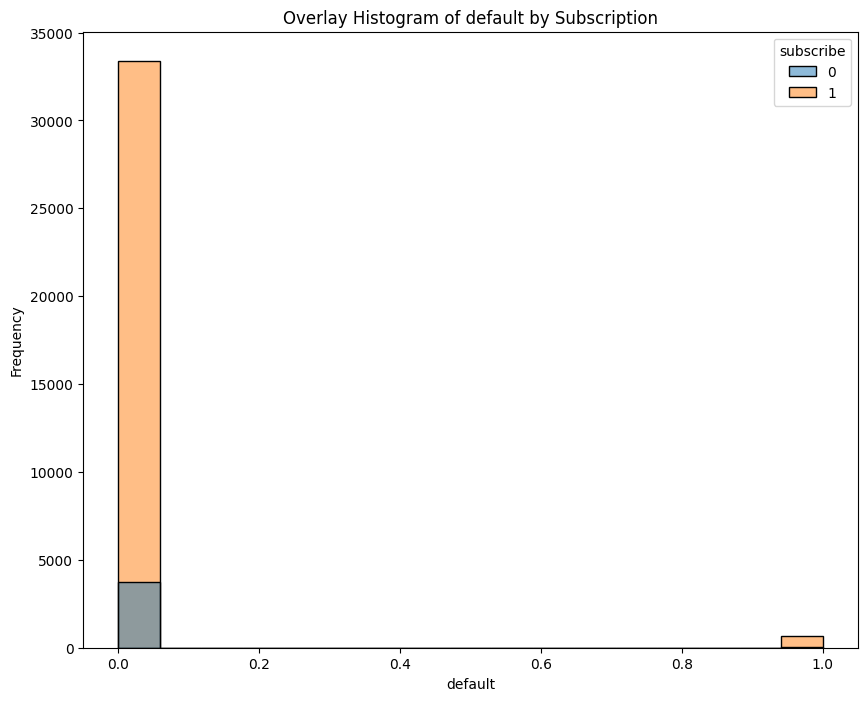

...

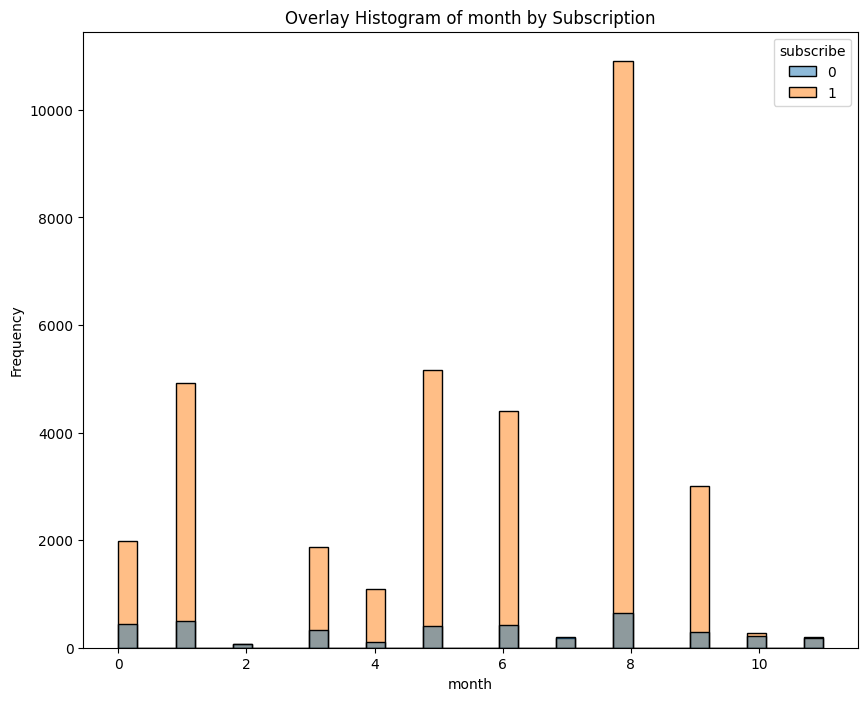

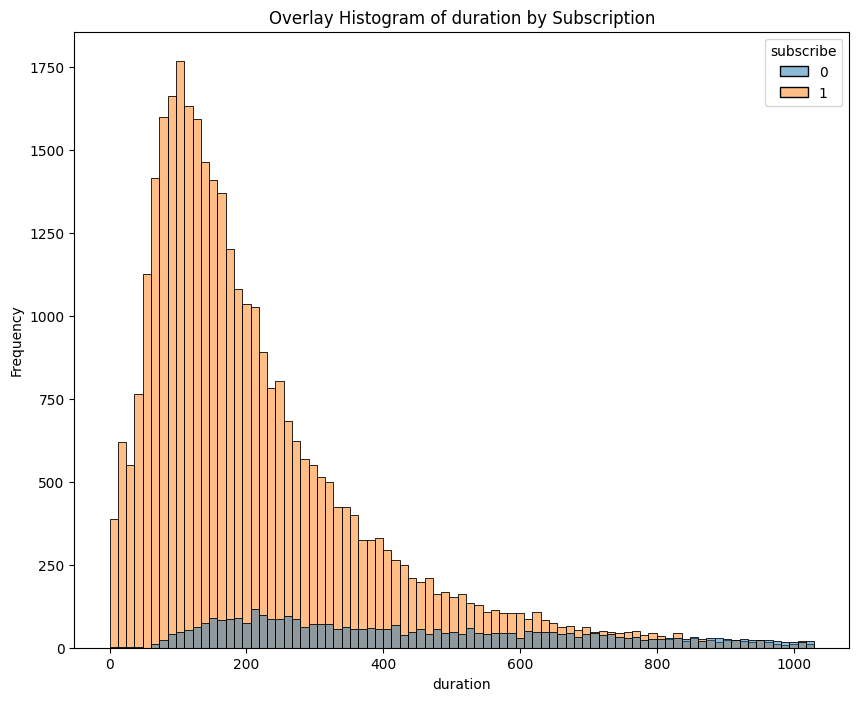

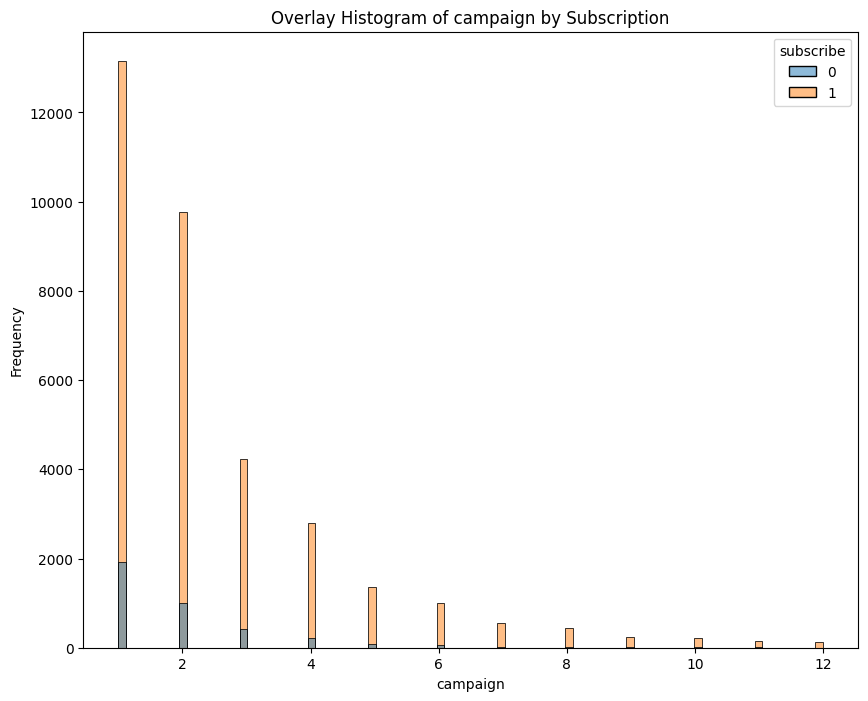

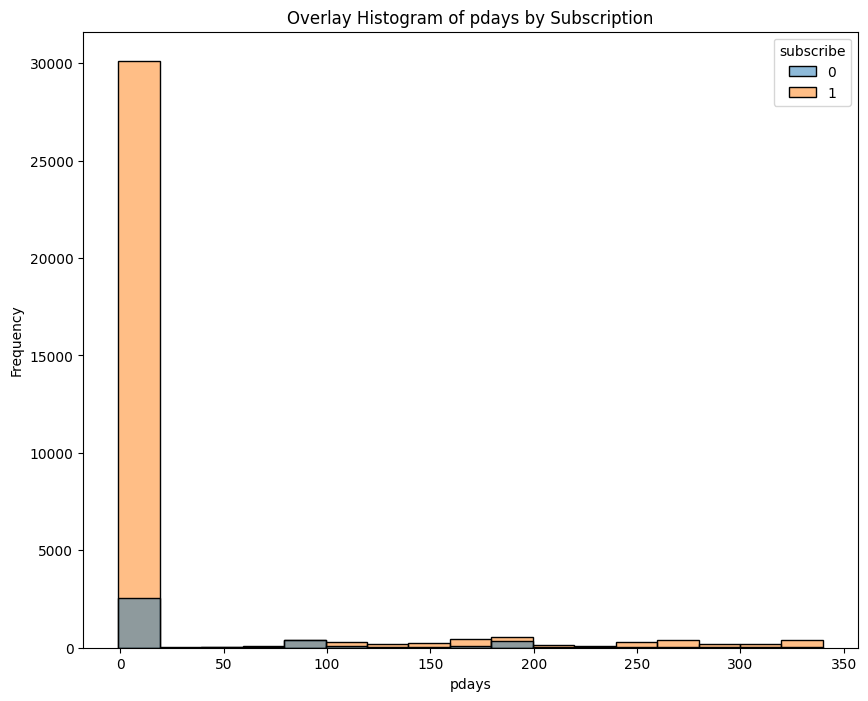

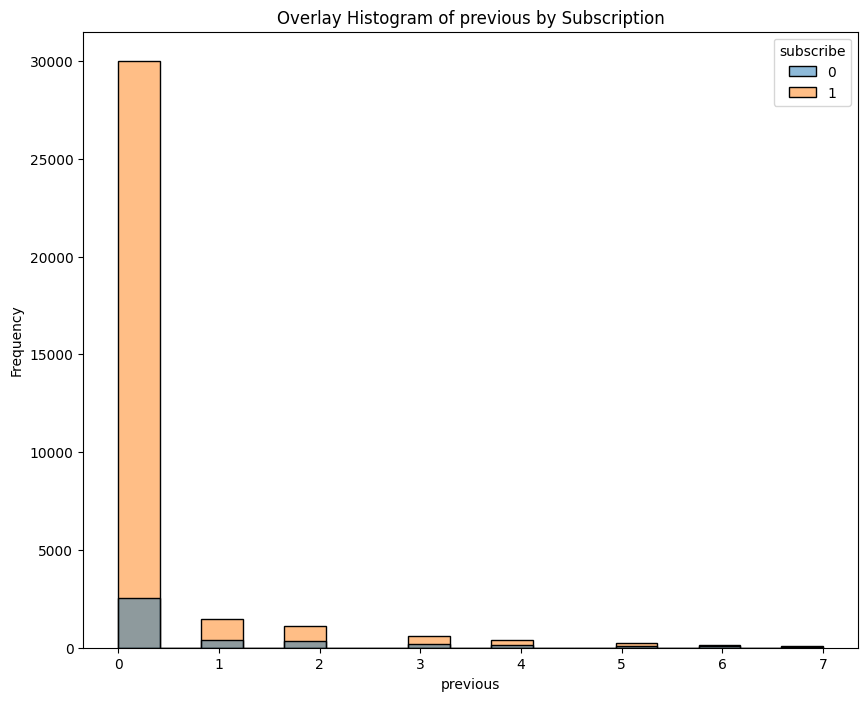

In [78]:
target_column = 'subscribe'
col_plot_cleaned = [col for col in TGP1_cleaned.columns if col != target_column]
for column in col_plot_cleaned:
    plt.figure(figsize=(10, 8))
    sns.histplot(data=TGP1_cleaned, x=column, hue=target_column,  common_norm=False)
    plt.title(f'Overlay Histogram of {column} by Subscription')
    plt.xlabel(column)
    plt.ylabel('Frequency')
plt.show()

####**Korelasi setelah praproses data**

In [79]:
TGP1_cleaned.corrwith(TGP1_cleaned["subscribe"]).sort_values(ascending=False)

subscribe    1.000000
housing      0.143662
campaign     0.075831
loan         0.069516
day          0.028736
month        0.024484
default      0.017491
age          0.014582
job         -0.040716
marital     -0.056418
balance     -0.064638
education   -0.080179
pdays       -0.114717
previous    -0.172234
duration    -0.362130
contact           NaN
dtype: float64